In [1]:
# imports
import matplotlib.pyplot as plt
import numpy as np
import scipy as sp
import sqlite3 as sql
import os
import pandas as pd
from datetime import datetime
from glob import glob
import sklearn as sk
import sklearn.linear_model

os.sys.path.append('../')
import PlaceCellAnalysis as pc
import utilities as u
import preprocessing as pp
import behavior as b
import BayesianDecoding as bd
import pickle


%load_ext autoreload
%autoreload 2

%matplotlib inline

In [2]:
# load sql database
# load session
mouse = '4139224.3'
df = pp.load_session_db()


#df = df[df['RewardCount']>30]
df = df[df['Imaging']==1]
df = df.sort_values(['MouseName','DateTime','SessionNumber'])

df_mouse = df[df['MouseName'].str.match(mouse)]
df_mouse = df_mouse[df_mouse['Track'].str.match('TwoTower_noTimeout') | df_mouse['Track'].str.match('TwoTower_Timeout')]
df_mouse

,MouseName,DateFolder,SessionNumber,Track,RewardCount,Imaging,ImagingRegion,DateTime,data file,scanfile,scanmat
823,4139224.3,18_10_2018,1,TwoTower_noTimeout,61,1,CA1,2018-10-18,G:\My Drive\\VR_Data\TwoTower\4139224.3\18_10_...,G:\My Drive\2P_Data\TwoTower\4139224.3\18_10_2...,G:\My Drive\2P_Data\TwoTower\4139224.3\18_10_2...
825,4139224.3,18_10_2018,3,TwoTower_noTimeout,41,1,CA1,2018-10-18,G:\My Drive\\VR_Data\TwoTower\4139224.3\18_10_...,G:\My Drive\2P_Data\TwoTower\4139224.3\18_10_2...,G:\My Drive\2P_Data\TwoTower\4139224.3\18_10_2...
859,4139224.3,20_10_2018,2,TwoTower_noTimeout,60,1,CA1,2018-10-20,G:\My Drive\\VR_Data\TwoTower\4139224.3\20_10_...,G:\My Drive\2P_Data\TwoTower\4139224.3\20_10_2...,G:\My Drive\2P_Data\TwoTower\4139224.3\20_10_2...
897,4139224.3,23_10_2018,1,TwoTower_Timeout,48,1,CA1,2018-10-23,G:\My Drive\\VR_Data\TwoTower\4139224.3\23_10_...,G:\My Drive\2P_Data\TwoTower\4139224.3\23_10_2...,G:\My Drive\2P_Data\TwoTower\4139224.3\23_10_2...
927,4139224.3,25_10_2018,1,TwoTower_Timeout,69,1,,2018-10-25,G:\My Drive\\VR_Data\TwoTower\4139224.3\25_10_...,G:\My Drive\2P_Data\TwoTower\4139224.3\25_10_2...,G:\My Drive\2P_Data\TwoTower\4139224.3\25_10_2...
951,4139224.3,26_10_2018,3,TwoTower_Timeout,72,1,CA1,2018-10-26,G:\My Drive\\VR_Data\TwoTower\4139224.3\26_10_...,G:\My Drive\2P_Data\TwoTower\4139224.3\26_10_2...,G:\My Drive\2P_Data\TwoTower\4139224.3\26_10_2...
967,4139224.3,27_10_2018,4,TwoTower_Timeout,67,1,CA1,2018-10-27,G:\My Drive\\VR_Data\TwoTower\4139224.3\27_10_...,G:\My Drive\2P_Data\TwoTower\4139224.3\27_10_2...,G:\My Drive\2P_Data\TwoTower\4139224.3\27_10_2...
977,4139224.3,29_10_2018,1,TwoTower_Timeout,71,1,CA1,2018-10-29,G:\My Drive\\VR_Data\TwoTower\4139224.3\29_10_...,G:\My Drive\2P_Data\TwoTower\4139224.3\29_10_2...,G:\My Drive\2P_Data\TwoTower\4139224.3\29_10_2...
988,4139224.3,30_10_2018,1,TwoTower_Timeout,78,1,CA1,2018-10-30,G:\My Drive\\VR_Data\TwoTower\4139224.3\30_10_...,G:\My Drive\2P_Data\TwoTower\4139224.3\30_10_2...,G:\My Drive\2P_Data\TwoTower\4139224.3\30_10_2...
1001,4139224.3,31_10_2018,2,TwoTower_Timeout,66,1,CA1,2018-10-31,G:\My Drive\\VR_Data\TwoTower\4139224.3\31_10_...,G:\My Drive\2P_Data\TwoTower\4139224.3\31_10_2...,G:\My Drive\2P_Data\TwoTower\4139224.3\31_10_2...


In [3]:
# pick a mouse

In [4]:
# pick a session
sess = df_mouse.iloc[8]
s = bd.single_session(sess)

G:\My Drive\2P_Data\TwoTower\4139224.3\30_10_2018\TwoTower_Timeout\TwoTower_Timeout_001_002.mat


C:\Users\mplitt\MightyMorphingPhotonRangers\preprocessing.py:203: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  frame['ca inds'] = caInds
C:\Users\mplitt\Anaconda3\lib\site-packages\pandas\core\frame.py:3790: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  downcast=downcast, **kwargs)


G:\My Drive\2P_Data\TwoTower\4139224.3\30_10_2018\TwoTower_Timeout\TwoTower_Timeout_001_002.mat
#subsystem#not made into numpy array
Anot made into numpy array
frame diff 0


C:\Users\mplitt\MightyMorphingPhotonRangers\utilities.py:251: RuntimeWarning: Mean of empty slice
  zone1_speed[i] = np.nanmean(sub_frame.loc[zone1_mask,'speed'])
C:\Users\mplitt\MightyMorphingPhotonRangers\utilities.py:61: RuntimeWarning: invalid value encountered in greater
  lick_inds = np.where(licks>0)[0]


In [5]:
s.trial_info['rewards']

array([1., 1., 1., 1., 1., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 0., 0., 0., 1., 1., 1., 0., 1., 1., 1., 0.,
       1., 0., 1., 1., 0., 1., 1., 1., 1., 0., 0., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 2., 1., 1., 1., 1., 1., 1., 0., 1., 1., 1., 1., 0., 1.,
       1., 1., 1., 1., 1.])

In [6]:
path = os.path.join("G:\\My Drive\\NonParametricDecoding\\data","%s_%s_%d" %(sess.MouseName, sess.DateFolder, sess.SessionNumber))
ctxt_LLR = np.load(os.path.join(path,"ctxt_LLR.npz"))

LLR = ctxt_LLR['arr_0']
LLR_pop=ctxt_LLR['arr_1']
pop_post_i = np.fromfile(os.path.join(path,"pop_pos_i.dat"),dtype='float32')
pop_post_ix = np.reshape(np.fromfile(os.path.join(path,"pop_post_ix.dat"),dtype='float32'),[s.C_z.shape[0],-1])

post_i = np.reshape(np.fromfile(os.path.join(path,"post_i.dat"),dtype='float32'),[s.C_z.shape[0],-1])

pc_path = os.path.join("G:\\My Drive\\Figures\\TwoTower\\COSYNE2019\\PlaceCells\\",mouse,
                       "%s_%s_%d_results.pkl" %(mouse,sess.DateFolder,sess.SessionNumber))
with open(pc_path,'rb') as f:
    pc_res = pickle.load(f)

In [7]:
print(s.C_z.shape)
print(pop_post_i.shape)
print(pop_post_ix.shape)

(32058, 1027)
(32058,)
(32058, 186)


In [8]:
print(pc_res.keys())
# get inds of different types
# # both
# bmask = pc_res['masks'][0] & pc_res['masks'][1]
# indsb = np.where(bmask)[0]
# sortb = np.argsort(np.argmax(pc_res['FR'][0]['all'][:,bmask]+pc_res['FR'][1]['all'][:,bmask],axis=0))
# indsb = indsb[sortb]
# # morph 0
# inds0 = np.where(pc_res['masks'][0] & ~bmask)[0]
# sort0 = np.argsort(np.argmax(pc_res['FR'][0]['all'][:,inds0],axis=0))
# inds0=inds0[sort0]
# # morph 1
# inds1 = np.where(pc_res['masks'][1] & ~bmask)[0]
# sort1 = np.argsort(np.argmax(pc_res['FR'][1]['all'][:,inds1],axis=0))
# inds1=inds1[sort1]


#sort regardless of place-cell ness 
inds = np.argsort(np.argmax(pc_res['FR'][0]['all']+pc_res['FR'][1]['all'],axis=0))


# sort by peak location in each one
# inds = np.append(np.append(indsb,inds0),inds1)
# get length of each group


dict_keys(['FR', 'masks', 'SI'])


In [9]:
s.C_z.shape

(32058, 1027)

C:\Users\mplitt\Anaconda3\lib\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


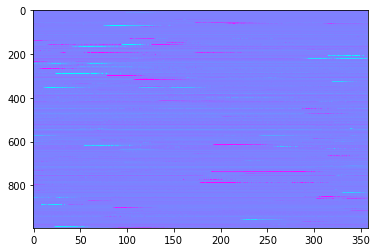

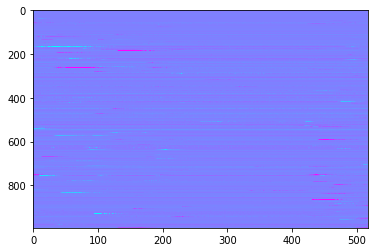

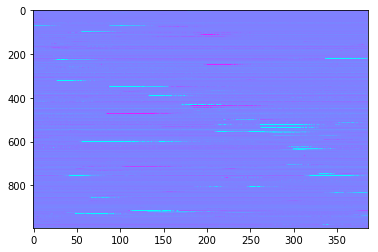

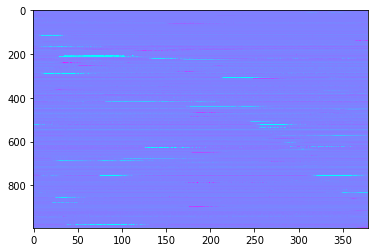

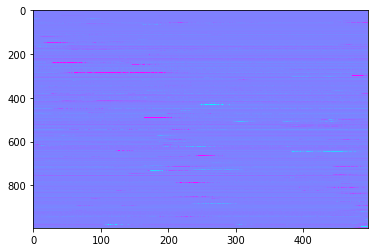

...

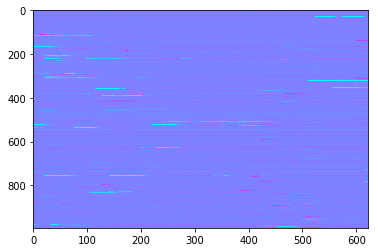

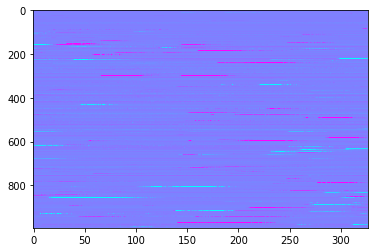

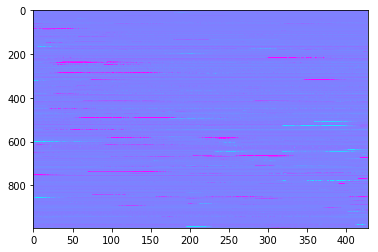

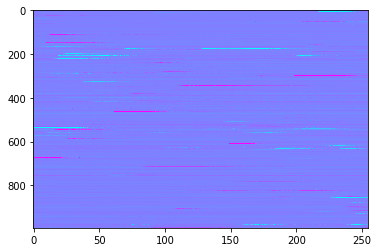

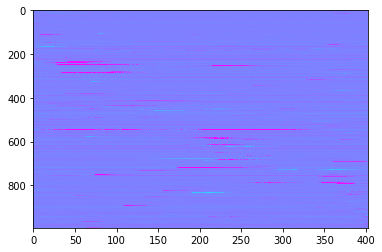

In [170]:
for t,(start,stop) in enumerate(zip(s.tstarts.tolist(),s.teleports.tolist())):
    f,ax = plt.subplots()
    ax.imshow(LLR[start:stop,inds].T,aspect='auto',cmap='cool',vmin=-2,vmax=2)

error making directory


C:\Users\mplitt\Anaconda3\lib\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


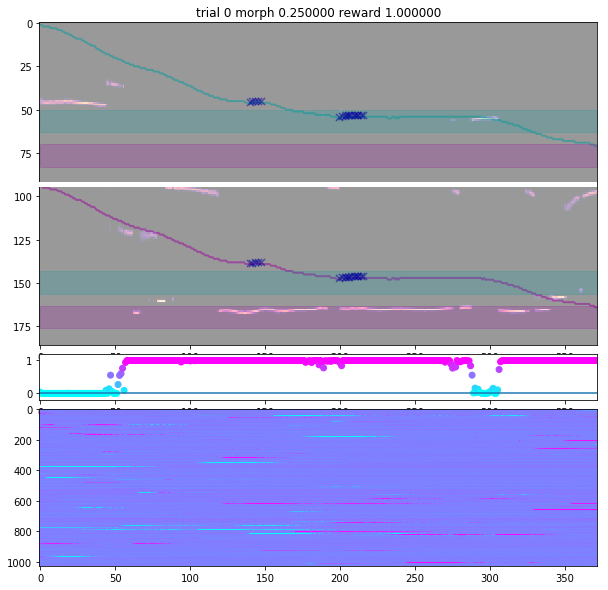

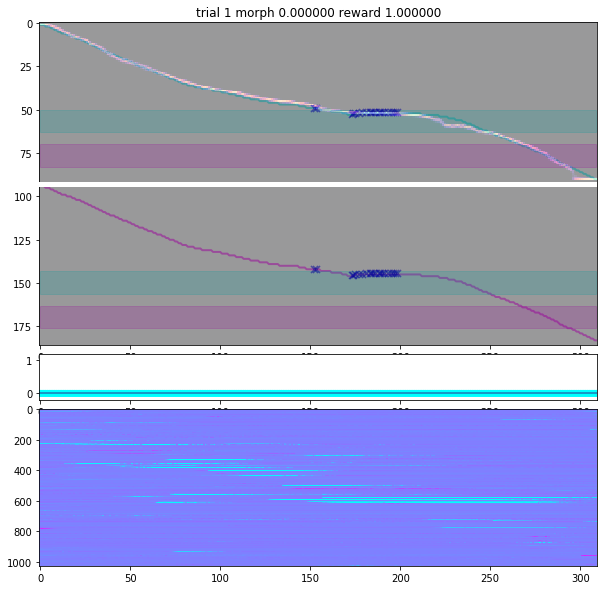

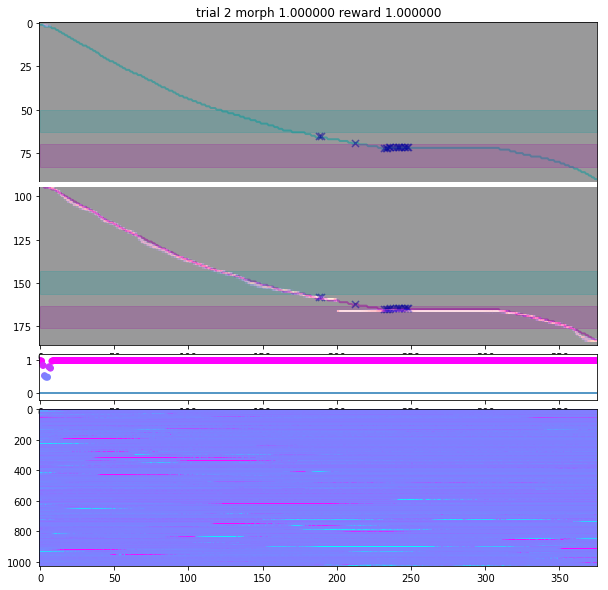

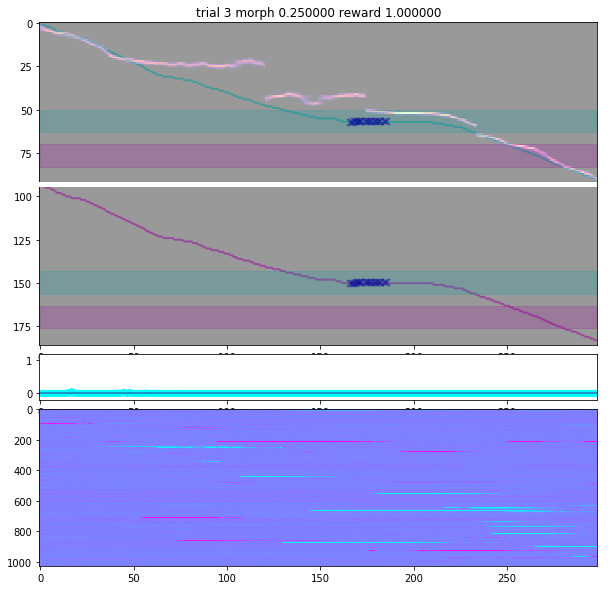

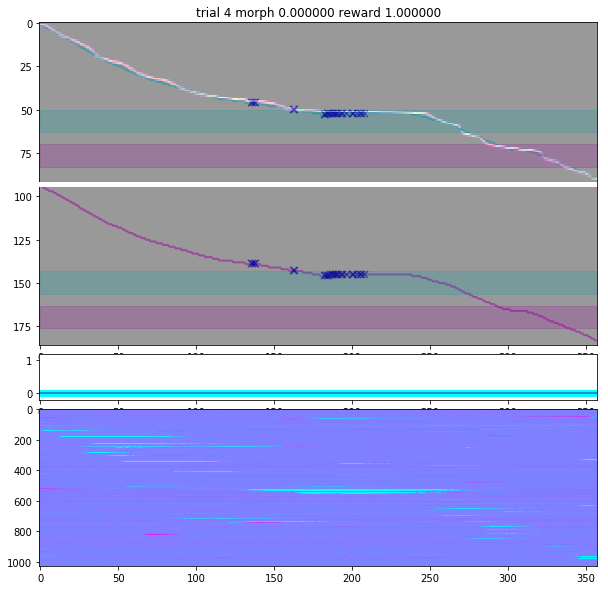

...

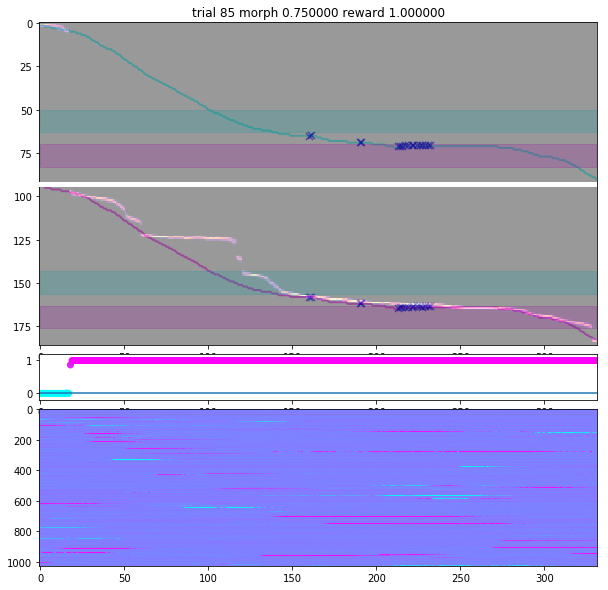

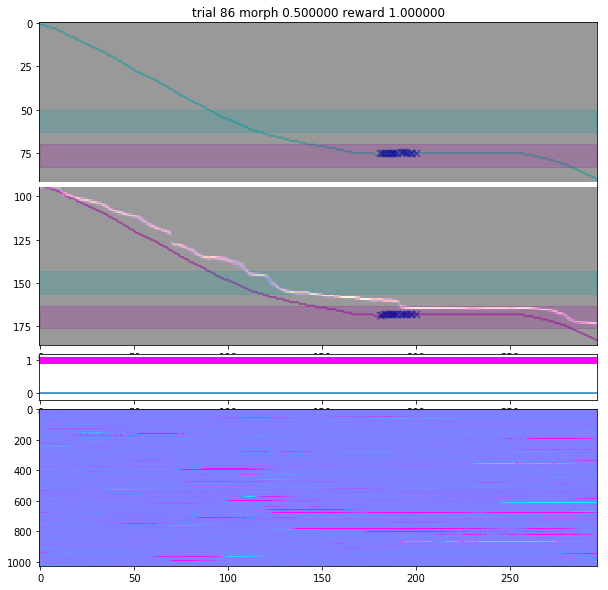

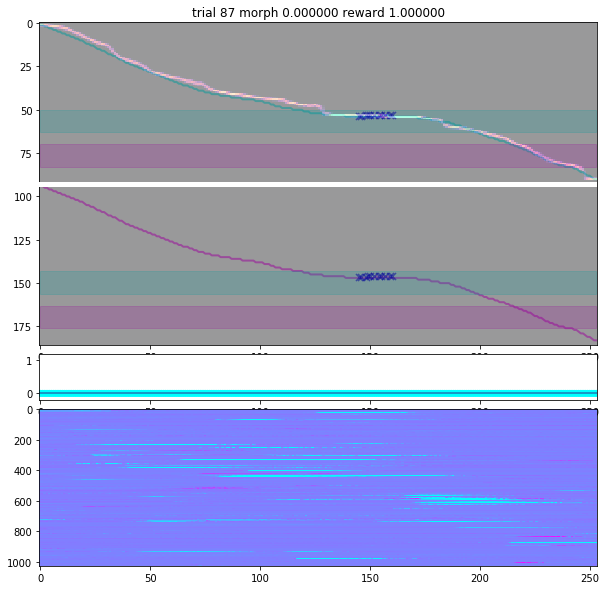

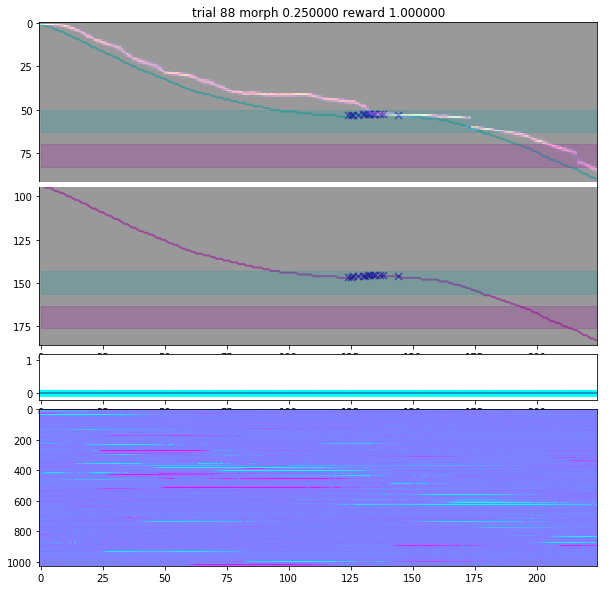

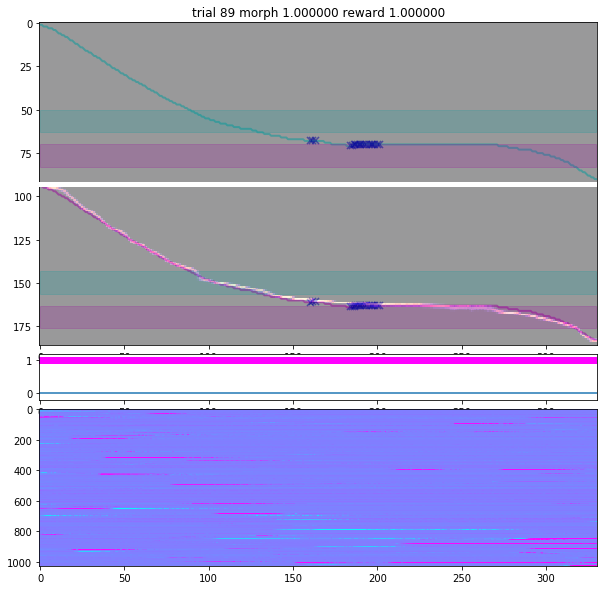

In [18]:
s.plot_decoding({'cell i': post_i,'pop ix':pop_post_ix,'pop i':pop_post_i},cellsort=inds,save=True)


(60, 90, 186)
0.0
0.0 (30, 90, 186)
1.0
1.0 (30, 90, 186)


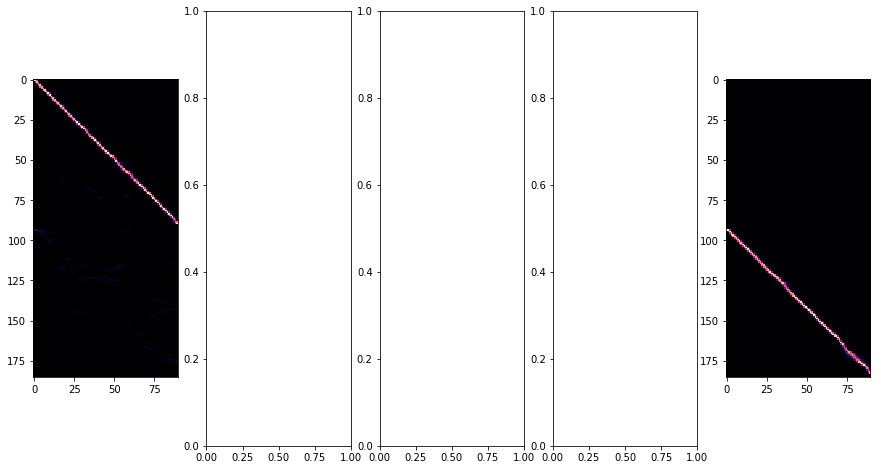

In [22]:
#confusion matrix
d_trial_mat,tr,tr,tr = u.make_pos_bin_trial_matrices(pop_post_ix,s.pos,s.tstarts,s.teleports)
d_morph_dict = u.trial_type_dict(d_trial_mat[:,:,:],s.trial_info['morphs'][:])

print(d_trial_mat.shape)
f,ax = plt.subplots(1,5,figsize=[15,8])
for m in d_morph_dict.keys():
    if m not in ('all','labels','indices'):
        print(m)
        print(m,d_morph_dict[m].shape)
        ax[int(m*4)].imshow(np.nanmean(d_morph_dict[m],axis=0).T,cmap='magma',vmin=0,vmax=.5)
    

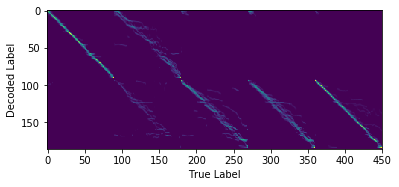

In [16]:
cm,fig=s.confusion_matrix({'pop ix':pop_post_ix},save=True)

(32058,)


C:\Users\mplitt\MightyMorphingPhotonRangers\BayesianDecoding.py:418: RuntimeWarning: Mean of empty slice
  mu_time[j,:] = np.nanmean(d_time[k],axis=0)
C:\Users\mplitt\Anaconda3\lib\site-packages\numpy\lib\nanfunctions.py:1545: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)


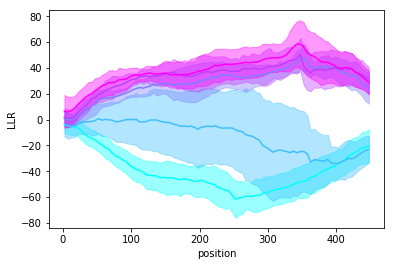

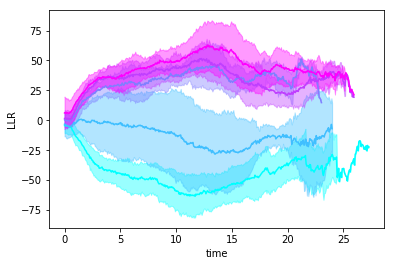

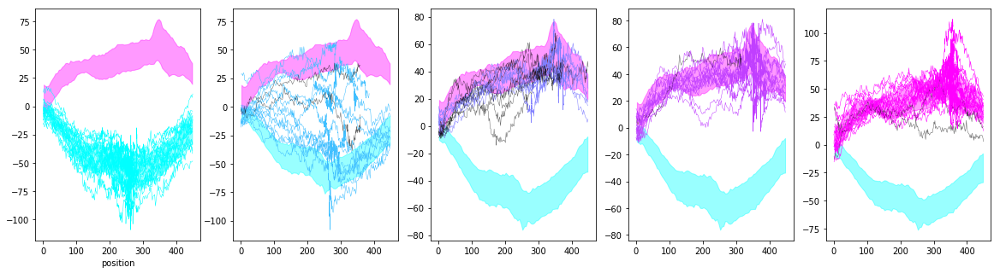

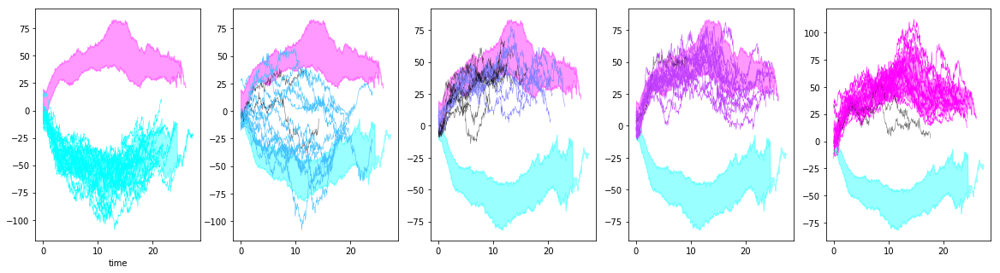

In [15]:
# log-likelihood ratios 
print(LLR_pop.shape)
mp,mt,pos,time = s.plot_llr(LLR_pop,save=True)
#mt[1].set_xlim([0,15])

In [12]:
# sort post_i by place field location

In [21]:
# trial to trial posteriors for single cells
cell_trial_mat,o,edges,centers = u.make_pos_bin_trial_matrices(post_i,s.pos,s.tstarts,s.teleports)
cell_d = u.trial_type_dict(cell_trial_mat,s.trial_info['morphs'])

In [19]:
perm = np.random.permutation(s.C_z.shape[1])[:20].tolist()

C:\Users\mplitt\Anaconda3\lib\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


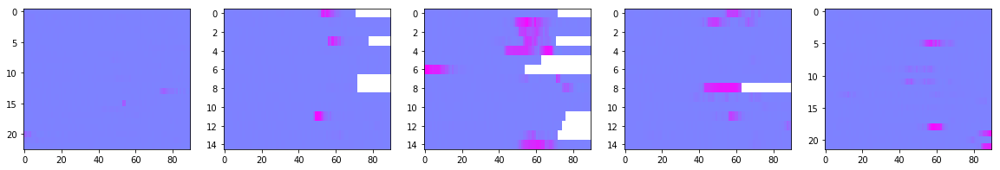

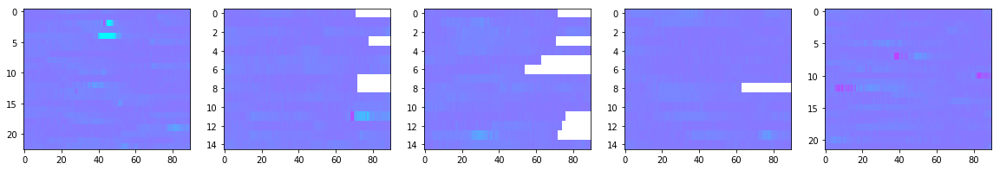

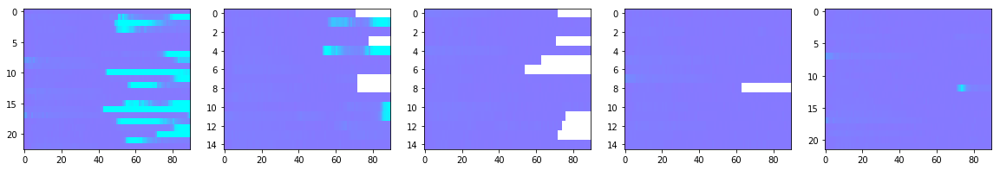

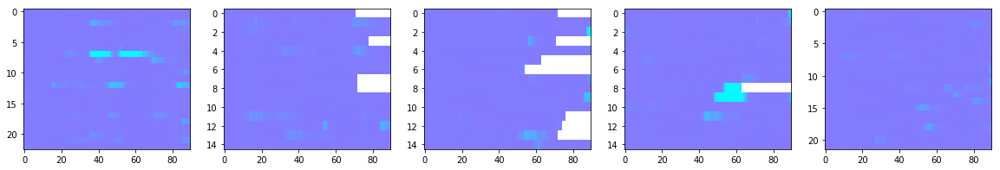

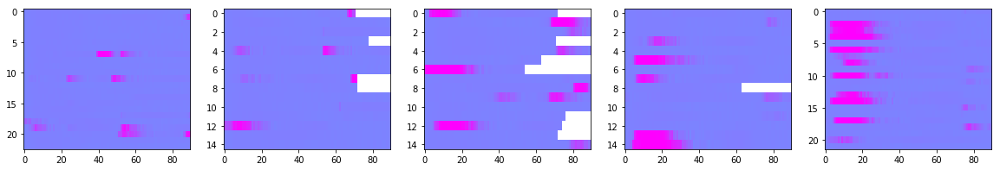

...

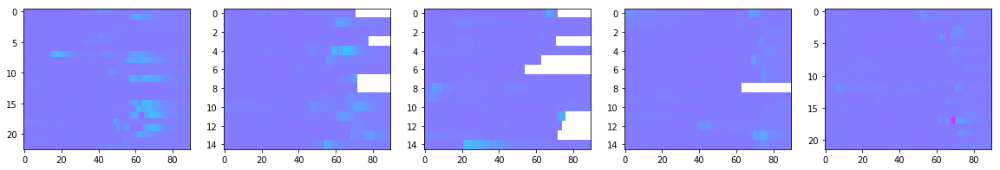

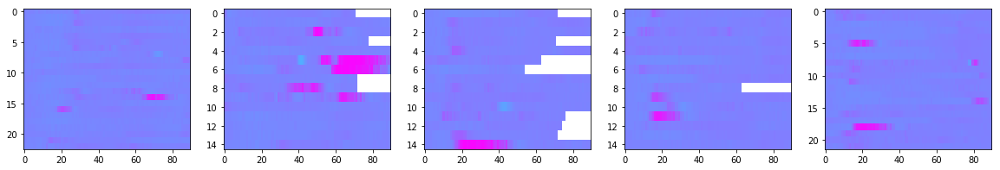

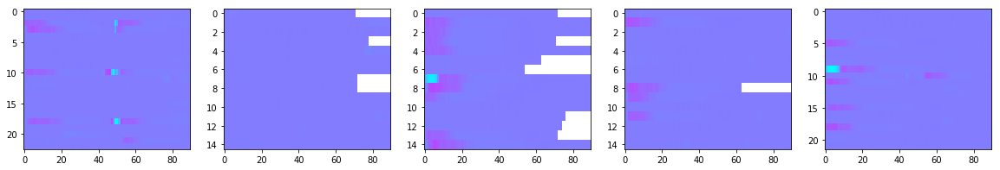

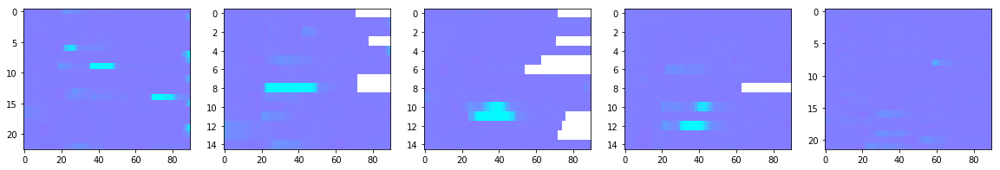

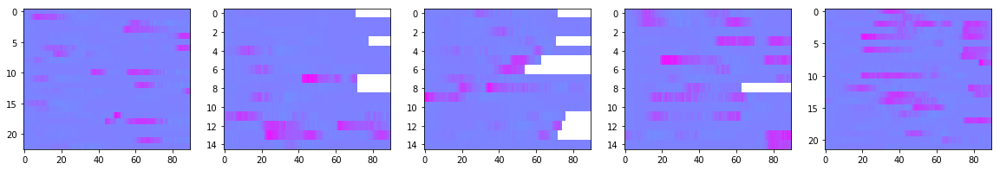

In [22]:
for c in perm: #range(0,s.C_z.shape[1],10):
    f,ax = plt.subplots(1,5,figsize=[20,3])
    for a,m in enumerate([0.,.25,.5,.75,1.]):
        ax[a].imshow(np.squeeze(cell_d[m][:,:,c]),cmap='cool',vmin=0,vmax=1,aspect='auto')
        #f.savefig("E:\\figTest\\%d.png" % c,format='png')

In [17]:
print(s.trial_info['wallJitter'])

[-0.0615417  -0.01834654 -0.04098219  0.0215134   0.05404813 -0.01627105
 -0.01098331 -0.04951615 -0.06444804  0.03238629 -0.04276263 -0.09848847
  0.05819366  0.01080686 -0.03680505  0.02997586 -0.06004493  0.04141473
  0.04850663  0.08048325 -0.09956207  0.06074047  0.09450214  0.05738387
 -0.04049949 -0.02717177 -0.02865362  0.05870557  0.07730599 -0.05922663
 -0.02394472  0.09601622  0.06227663 -0.03023917  0.03098961 -0.07883718
 -0.02736885  0.00590006  0.07706302 -0.05734145  0.06751263 -0.01523186
  0.03800401  0.0564101  -0.05749704 -0.05224239  0.08579841  0.05479572
 -0.04350209  0.00905482 -0.05635059 -0.08066356  0.07072079 -0.09187327
  0.00655671  0.05197699 -0.06149418 -0.02895028  0.0150694   0.06228819
 -0.0698822  -0.05206634  0.04553593 -0.01556207 -0.08302207  0.00650636
  0.0611193  -0.033698   -0.06231081  0.08065949  0.07353254 -0.01086806
  0.06094685  0.03920082  0.04934632 -0.0973969   0.07857674  0.0218412
 -0.04358358  0.05376208  0.01199633 -0.07566387  0.